In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from PIL import Image
import matplotlib.pyplot as plt

import torch
from tqdm import tqdm


In [3]:
fname = "../kaggle-data/vesuvius-challenge-ink-detection/train/1/surface_volume/00.tif"
# load the image
img = Image.open(fname)
arr = np.array(img, dtype=np.uint16)
arr

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [4]:
np.max(arr)

65535

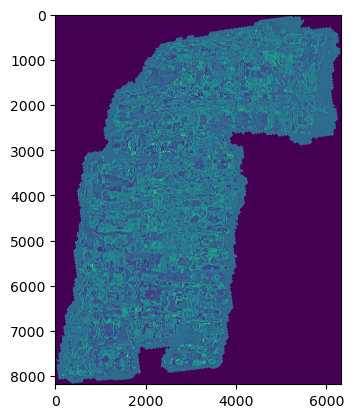

In [5]:
plt.imshow(arr)

In [6]:
arr.shape

(8181, 6330)

In [7]:
arr_2 = arr[1:] # (8180, 6330)

# Assuming that arr_2 is the original image array
# Convert the image to a PyTorch tensor
arr_2_tensor = torch.from_numpy(arr_2)
# Reshape the tensor to have a channel dimension of 1
arr_2_tensor = arr_2_tensor.unsqueeze(0).unsqueeze(0)
# Define the kernel size for the average pooling
kernel = 8
kernel_size = (kernel, kernel)
# Perform the average pooling with stride=32 to downsample the image by 32 and take the average across 32x32 pixels
new_image_tensor = torch.nn.functional.avg_pool2d(arr_2_tensor, kernel_size=kernel_size, stride=kernel)
# Convert the output tensor back to a numpy array
new_image = new_image_tensor.squeeze().numpy()

new_image.shape

TypeError: can't convert np.ndarray of type numpy.uint16. The only supported types are: float64, float32, float16, complex64, complex128, int64, int32, int16, int8, uint8, and bool.

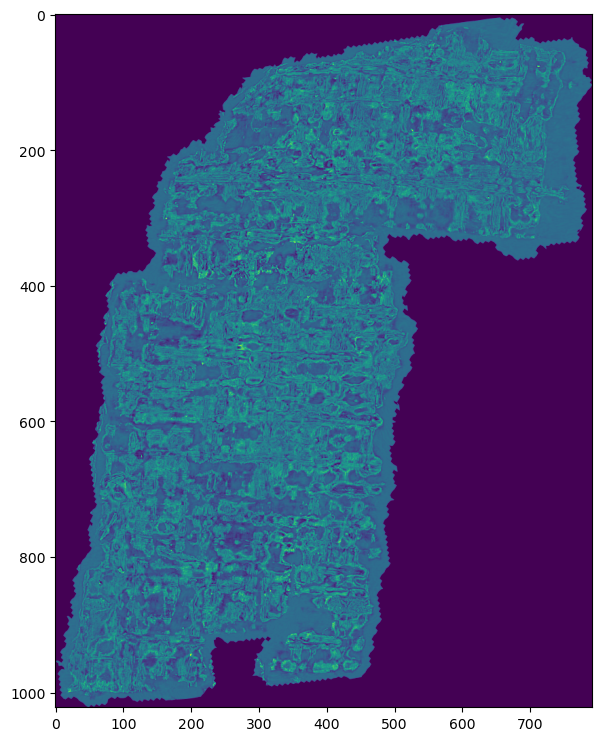

In [ ]:
plt.figure(figsize=(16, 9))
plt.imshow(new_image)

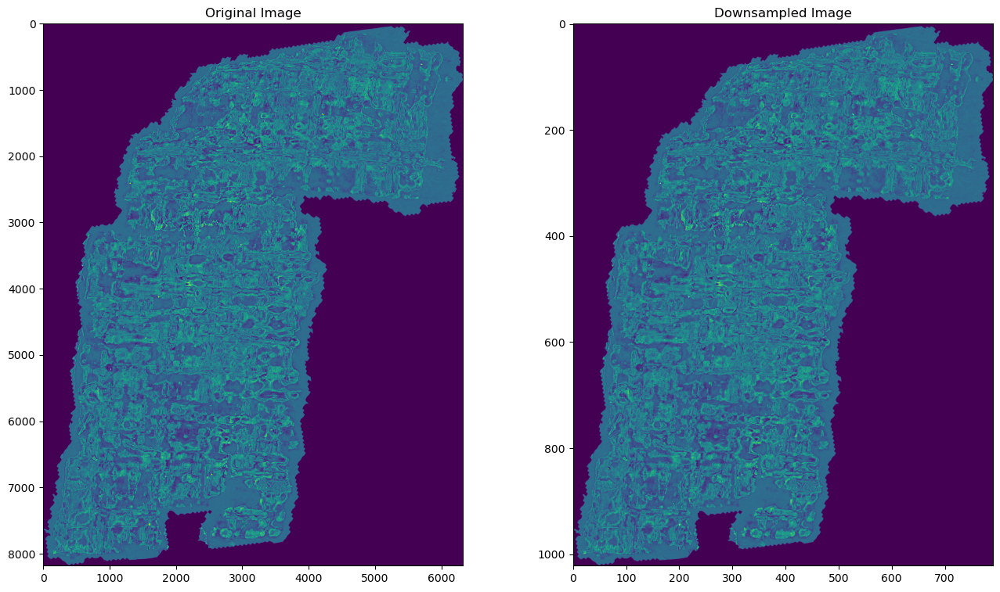

In [ ]:
import matplotlib.pyplot as plt

# Assuming that arr_2 is the original image array and new_image is the downsampled image
# Create a new figure with a size of 16x9 inches
fig = plt.figure(figsize=(16, 9))
# Create the first subplot for the original image
ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(arr_2)
ax1.set_title('Original Image')
# Create the second subplot for the downsampled image
ax2 = fig.add_subplot(1, 2, 2)
ax2.imshow(new_image)
ax2.set_title('Downsampled Image')
# Display the figure
plt.show()


(1024, 1024)
(128, 128)


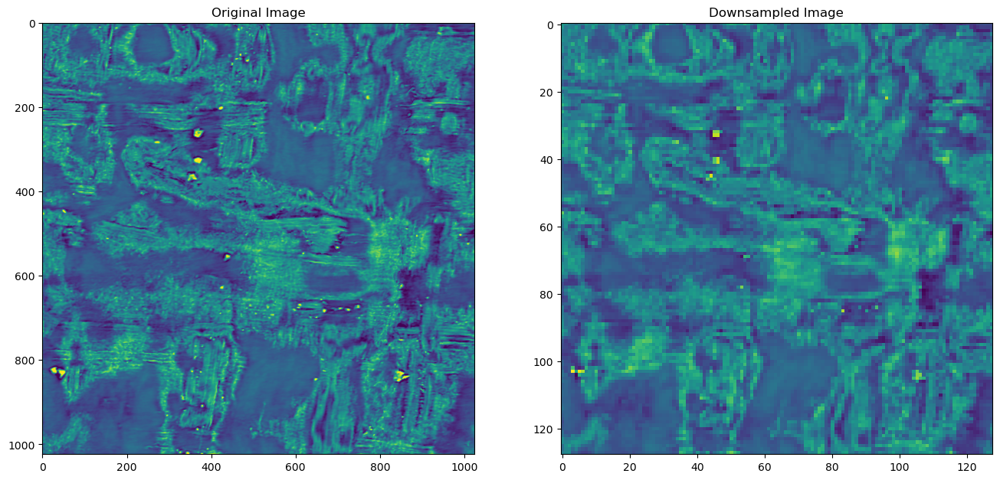

In [ ]:
import matplotlib.pyplot as plt

x1 = 1000
x2 = x1+1024
y1 = 6000
y2 = y1+1024

# Assuming that arr_2 is the original image array and new_image is the downsampled image
# Create a new figure with a size of 16x9 inches
fig = plt.figure(figsize=(16, 9))
# Create the first subplot for the original image
ax1 = fig.add_subplot(1, 2, 1)
x = arr_2[y1:y2, x1:x2]
ax1.imshow(x)
ax1.set_title('Original Image')

print(x.shape)

# Assuming that arr_2 is the original image array
# Convert the image to a PyTorch tensor
arr_2_tensor = torch.from_numpy(x)
# Reshape the tensor to have a channel dimension of 1
arr_2_tensor = arr_2_tensor.unsqueeze(0).unsqueeze(0)
# Define the kernel size for the average pooling
kernel = 8
kernel_size = (kernel, kernel)
# Perform the average pooling with stride=32 to downsample the image by 32 and take the average across 32x32 pixels
new_image_tensor = torch.nn.functional.avg_pool2d(arr_2_tensor, kernel_size=kernel_size, stride=kernel)
# Convert the output tensor back to a numpy array
new_image = new_image_tensor.squeeze().numpy()
print(new_image.shape)



# Create the second subplot for the downsampled image
ax2 = fig.add_subplot(1, 2, 2)
ax2.imshow(new_image)
ax2.set_title('Downsampled Image')
# Display the figure
plt.show()


In [ ]:
fname = "/kaggle/input/vesuvius-challenge-ink-detection/train/2/inklabels.png"
# load the image
label_img = Image.open(fname)
label_img = np.array(label_img, dtype=np.float32)
label_img.shape

/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (140973980 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


(14830, 9506)

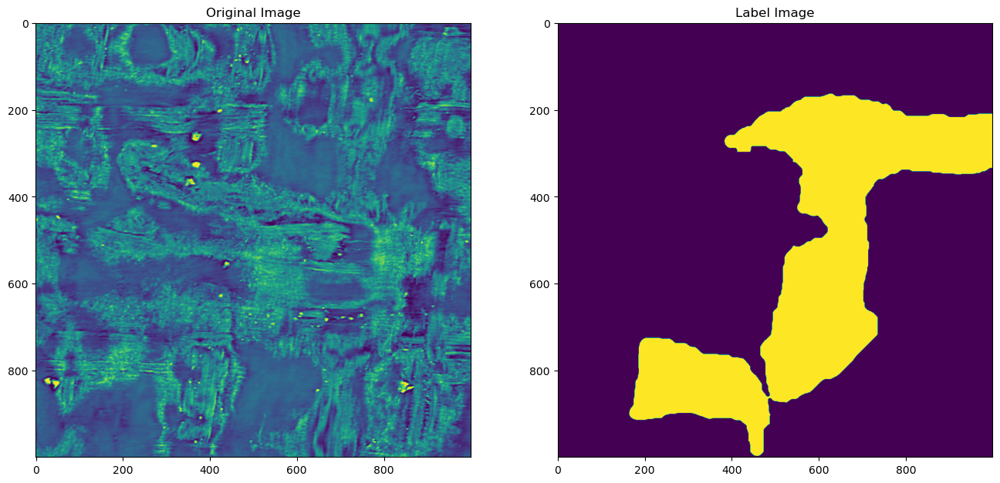

In [ ]:
import matplotlib.pyplot as plt

x1 = 1000
x2 = 2000
y1 = 6000
y2 = 7000

# Assuming that arr_2 is the original image array and new_image is the downsampled image
# Create a new figure with a size of 16x9 inches
fig = plt.figure(figsize=(16, 9))
# Create the first subplot for the original image
ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(arr_2[y1:y2, x1:x2])
ax1.set_title('Original Image')


# Create the second subplot for the downsampled image
ax2 = fig.add_subplot(1, 2, 2)
ax2.imshow(label_img[y1:y2, x1:x2])
ax2.set_title('Label Image')
# Display the figure
plt.show()


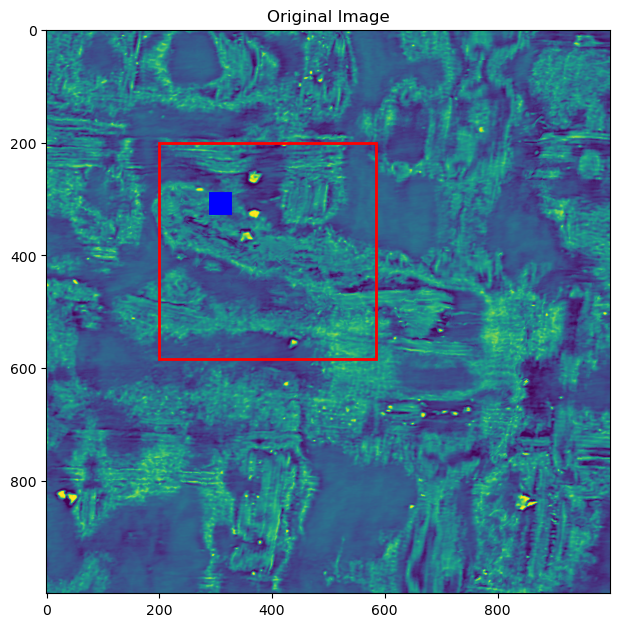

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

x1 = 1000
x2 = 2000
y1 = 6000
y2 = 7000

# Assuming that arr_2 is the original image array and new_image is the downsampled image
# Create a new figure with a size of 16x9 inches
fig = plt.figure(figsize=(16, 9))
# Create the first subplot for the original image
ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(arr_2[y1:y2, x1:x2] + label_img[y1:y2, x1:x2])
ax1.set_title('Original Image')
# Add the rectangle patch to the original image
rect = Rectangle((200+100, 200+100), 16, 16, linewidth=10, edgecolor='b', facecolor='none')
rect2 = Rectangle((200, 200), 384, 384, linewidth=2, edgecolor='r', facecolor='none')
ax1.add_patch(rect)
ax1.add_patch(rect2)
# Display the figure
plt.show()


In [ ]:

# load the image

sums = []
vars = []
for i in tqdm(range(64)):
    fname = f"/kaggle/input/vesuvius-challenge-ink-detection/train/1/surface_volume/{i:02d}.tif"
    img = Image.open(fname)
    x = np.array(img, dtype=np.int16)
    s = np.sum(x)
    v = np.var(x)
    sums.append(s)
    vars.append(v)

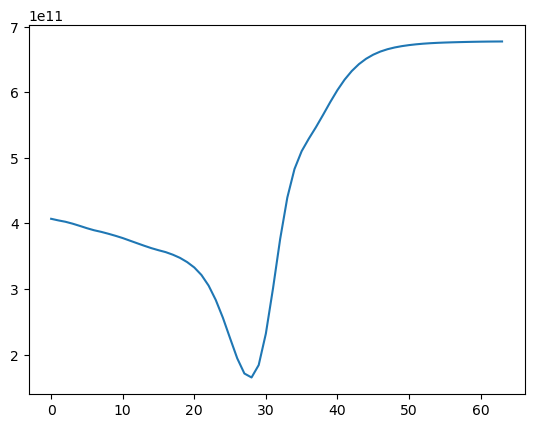

In [ ]:
plt.plot(sums)

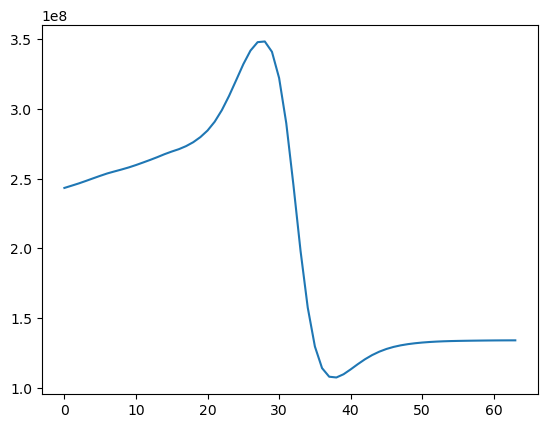

In [ ]:
plt.plot(vars)

In [ ]:
fname = "/kaggle/input/vesuvius-challenge-ink-detection/train/2/mask.png"
# load the image
img = Image.open(fname)
arr = np.array(img, dtype=np.float32)
arr

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
cs = np.cumsum(arr, axis=1)
am = np.argmax(cs, axis=1) - 384
am[am<0] = 0

arr.shape, am.shape, am[:10]

((14830, 9506),
 (14830,),
 array([   0, 3339, 3340, 3341, 3343, 3344, 3346, 3347, 3348, 3350]))

# Do different layers of the image contain similar information?

In [8]:
fname = "../kaggle-data/vesuvius-challenge-ink-detection/train/1/surface_volume/00.tif"
# load the image
img = Image.open(fname)
arr_1 = np.array(img, dtype=np.uint16)

fname = "../kaggle-data/vesuvius-challenge-ink-detection/train/1/surface_volume/15.tif"
# load the image
img = Image.open(fname)
arr_2 = np.array(img, dtype=np.uint16)

fname = "../kaggle-data/vesuvius-challenge-ink-detection/train/1/surface_volume/20.tif"
# load the image
img = Image.open(fname)
arr_1 = np.array(img, dtype=np.uint16)


arr

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [12]:
layers = np.arange(64)[::4] # 64 -> 16
# Loop over images and plot them, with title corresponding to the layer number
for i in tqdm(layers):
    fname = f"/kaggle/input/vesuvius-challenge-ink-detection/train/1/surface_volume/{i:02d}.tif"
    img = Image.open(fname)
    x = np.array(img, dtype=np.int16)

(16,)

  0%|          | 0/16 [00:00<?, ?it/s]

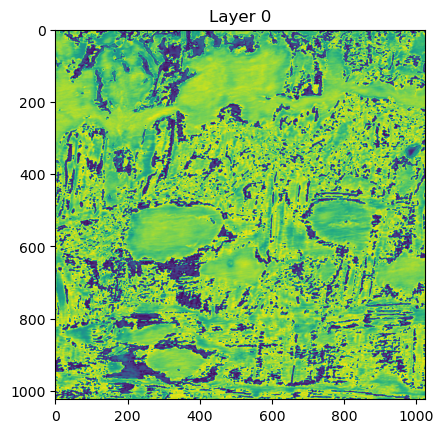

  6%|▋         | 1/16 [00:00<00:05,  2.95it/s]

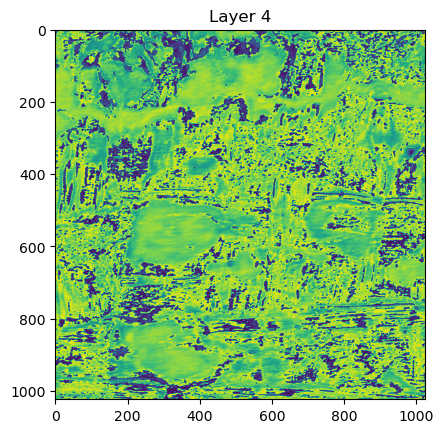

 12%|█▎        | 2/16 [00:00<00:04,  2.86it/s]

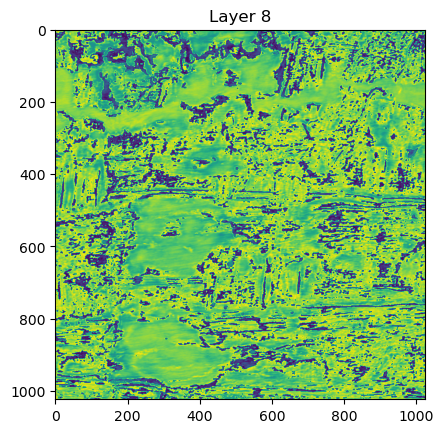

 19%|█▉        | 3/16 [00:01<00:04,  2.82it/s]

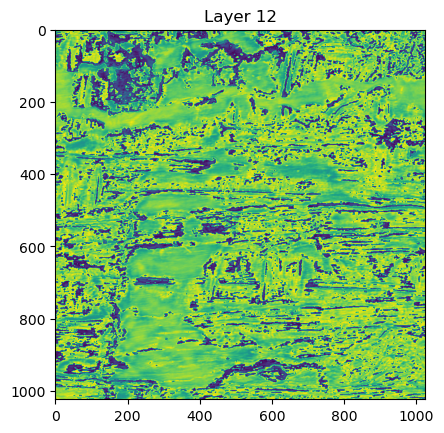

 25%|██▌       | 4/16 [00:01<00:04,  2.74it/s]

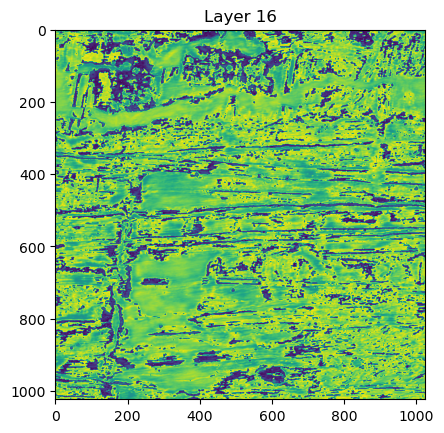

 31%|███▏      | 5/16 [00:01<00:03,  2.76it/s]

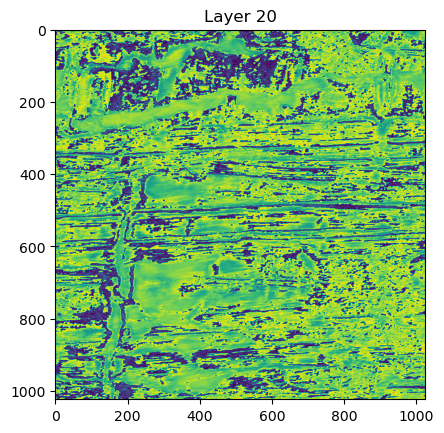

 38%|███▊      | 6/16 [00:02<00:03,  2.74it/s]

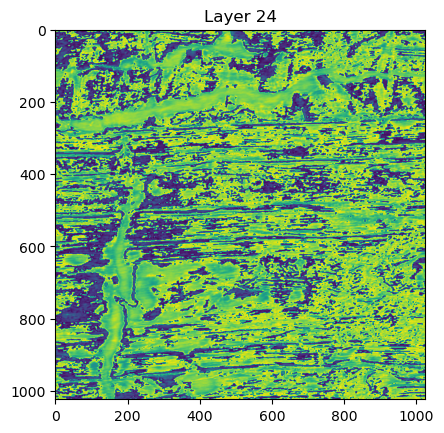

 44%|████▍     | 7/16 [00:02<00:03,  2.78it/s]

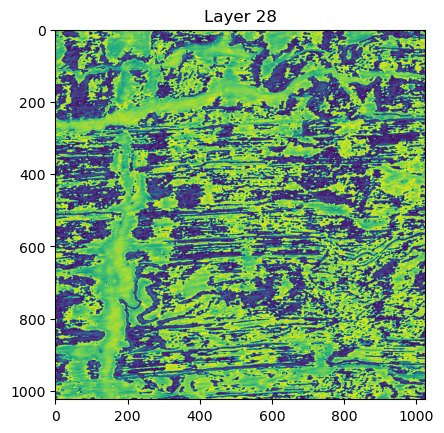

 50%|█████     | 8/16 [00:02<00:02,  2.79it/s]

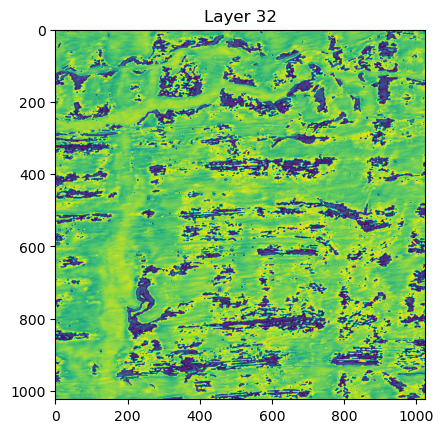

 56%|█████▋    | 9/16 [00:03<00:02,  2.85it/s]

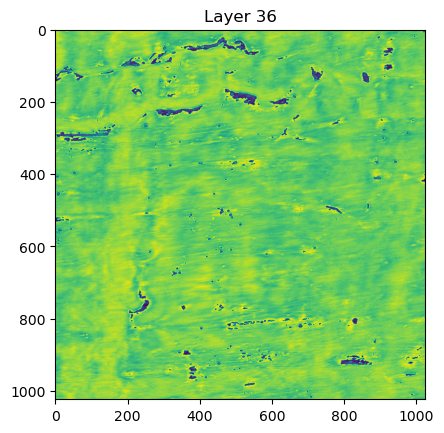

 62%|██████▎   | 10/16 [00:03<00:02,  2.81it/s]

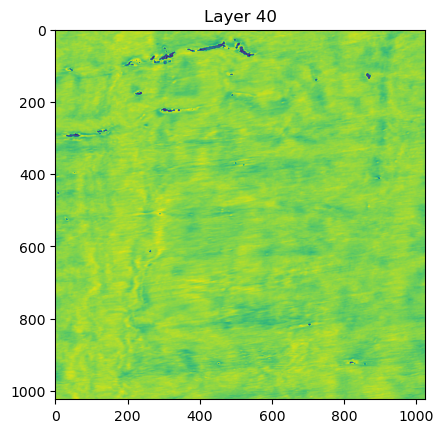

 69%|██████▉   | 11/16 [00:03<00:01,  2.81it/s]

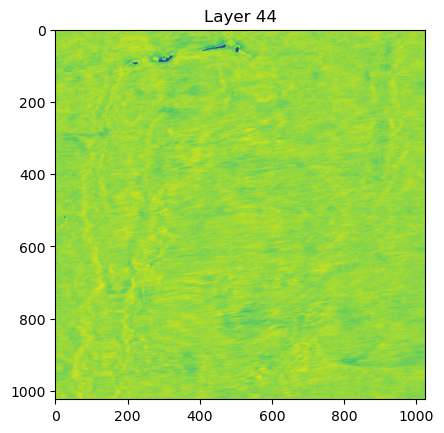

 75%|███████▌  | 12/16 [00:04<00:01,  2.77it/s]

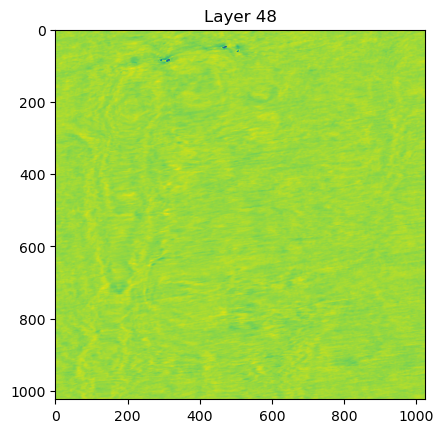

 81%|████████▏ | 13/16 [00:04<00:01,  2.79it/s]

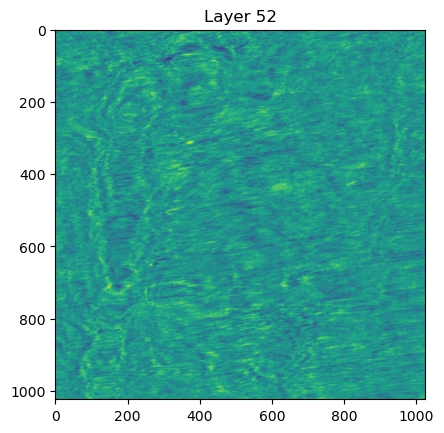

 88%|████████▊ | 14/16 [00:05<00:00,  2.78it/s]

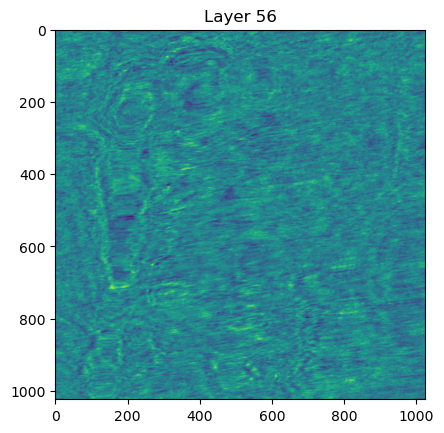

 94%|█████████▍| 15/16 [00:05<00:00,  2.78it/s]

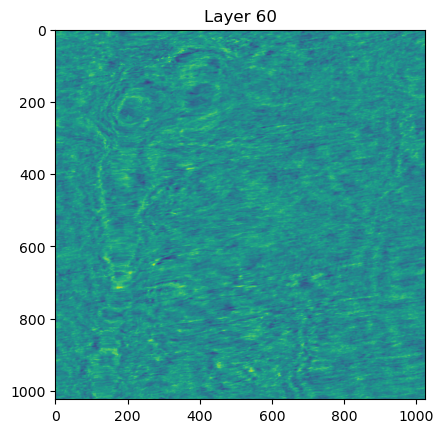

100%|██████████| 16/16 [00:05<00:00,  2.79it/s]


In [16]:
# Loop over images and plot them, with title corresponding to the layer number
for i in tqdm(layers):
    fname = f"../kaggle-data/vesuvius-challenge-ink-detection/train/1/surface_volume/{i:02d}.tif"
    img = Image.open(fname)
    x = np.array(img, dtype=np.int16)
    x1 = 2000
    x2 = x1+1024
    y1 = 3000
    y2 = y1+1024
    x = x[y1:y2, x1:x2]
    
    # Plot the image with appropriate title
    plt.figure()
    plt.imshow(x)
    plt.title(f"Layer {i}")
    plt.show()

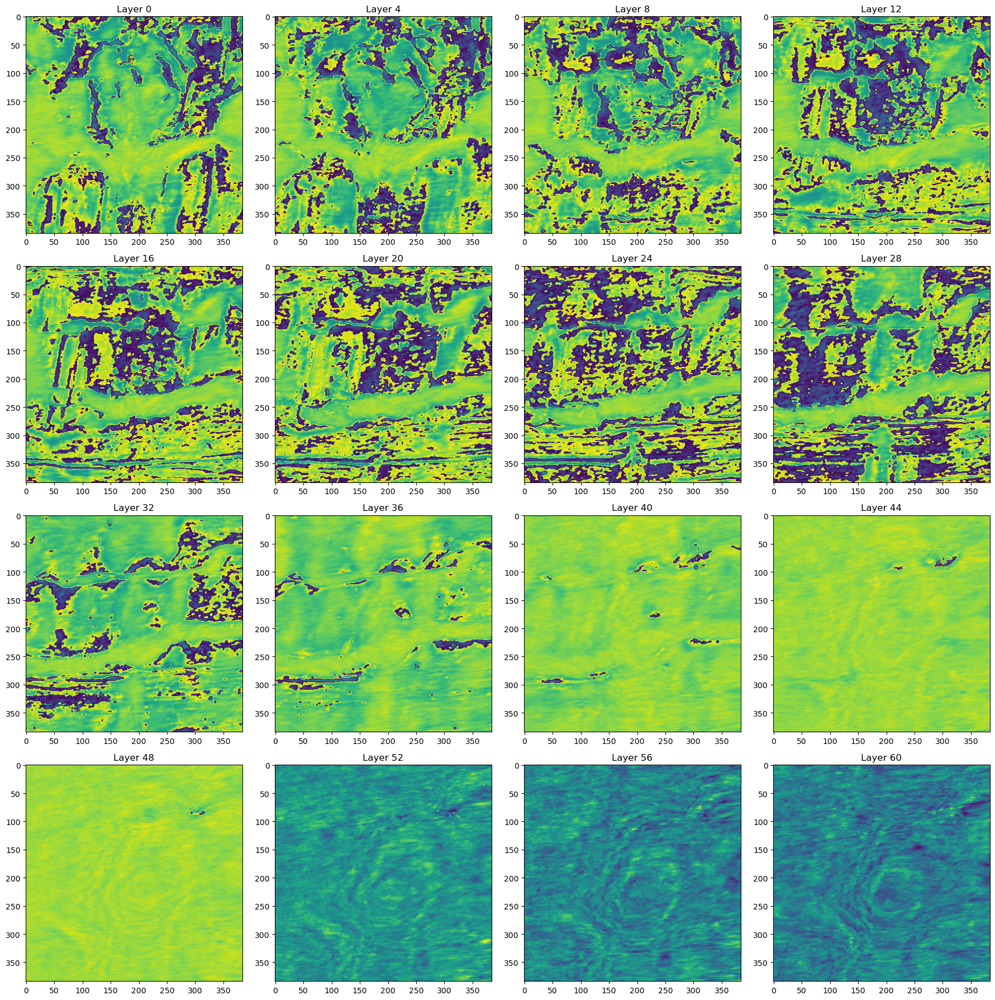

In [19]:
# Create a 4x4 grid of subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18, 18))

# Loop over images and plot them, with title corresponding to the layer number
for i, ax in zip(layers, axes.flatten()):
    fname = f"../kaggle-data/vesuvius-challenge-ink-detection/train/1/surface_volume/{i:02d}.tif"
    img = Image.open(fname)
    x = np.array(img, dtype=np.int16)
    x1 = 2000
    x2 = x1+384
    y1 = 3000
    y2 = y1+384
    x = x[y1:y2, x1:x2]
    
    # Plot the image on the appropriate subplot with title
    ax.imshow(x)
    ax.set_title(f"Layer {i}")

# Adjust spacing and display the figure
plt.tight_layout()
plt.show()
